<a href="https://colab.research.google.com/github/gabrielmelo00/Machine-Learning-Projects/blob/main/Conversion_of_Sampling_Frequency_and_STFT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Practical work on the Conversion of sampling frequency and STFT


*Template from R. Badeau and G. Richard (with help from P. Vernhet), MAJ:2020*



## Students:
#### Gabriela Barbosa Guedes Pereira
#### Gabriel Silva Vieira de Melo


## Importing Libraries

In [ ]:
!apt install libasound2-dev portaudio19-dev libportaudio2 libportaudiocpp0 ffmpeg
!pip install PyAudio
!pip install soundfile

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libportaudio2 is already the newest version (19.6.0-1).
libportaudiocpp0 is already the newest version (19.6.0-1).
portaudio19-dev is already the newest version (19.6.0-1).
libasound2-dev is already the newest version (1.1.3-5ubuntu0.6).
ffmpeg is already the newest version (7:3.4.8-0ubuntu0.2).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.


In [ ]:
import os, sys, wave, struct

import numpy as np
import pyaudio
import pandas as pd
import matplotlib.pyplot as plt
import scipy.signal as signal

from copy import deepcopy
from math import ceil
from scipy.io.wavfile import write

import soundfile as sf
from IPython.display import Audio

import time

## Functions

In [ ]:
def load_sound(file):
    return wave.open(file, 'rb')


def play_sound(file, chunk = 1024):
    """
    Script from PyAudio doc
    """
    wf = load_sound(file)
    p = pyaudio.PyAudio()
    stream = p.open(format=p.get_format_from_width(wf.getsampwidth()),
                    channels=wf.getnchannels(),
                    rate=wf.getframerate(),
                    output=True)
    data = wf.readframes(chunk)

    while data:
        stream.write(data)
        data = wf.readframes(chunk )

    stream.stop_stream()
    stream.close()
    p.terminate()
    
    
def plot_sound(data, times, name='default_name', save=False):
    plt.figure(figsize=(30, 4))
    plt.fill_between(times, data)
    plt.xlim(times[0], times[-1])
    plt.xlabel('time (s)')
    plt.ylabel('amplitude')
    if save:
        plt.savefig(name+'.png', dpi=100)
    plt.show()

## Reading and playing .wav file

Choose the name of sound for the rest of the notebook. Sounds are assumed to be set in a folder named 'sons_mutltipitch' (same directory as notebook).

In [ ]:
data_path = os.getcwd()
filename = 'caravan_48khz.wav'
sound = os.path.join(data_path, filename) 

### **Using wave**

In [ ]:
wavefile = load_sound(sound)
print(wavefile.getparams())

(1, 2, 48000, 805733, 'NONE', 'not compressed')


In [ ]:
play = False
if play :
    play_sound(sound) 

In [ ]:
Fs = int(wavefile.getframerate())
num_samples = int(wavefile.getnframes())
data = wavefile.readframes(num_samples)
data = struct.unpack('{n}h'.format(n=num_samples), data)
x = np.array(data)

In [ ]:
timestep = 1/float(Fs)
times = np.arange(len(x))*timestep

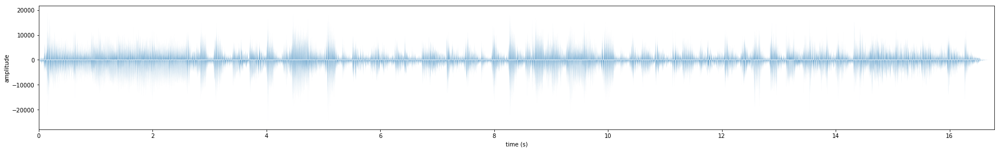

In [ ]:
plot_sound(x, times)

## **1.** Conversion of sampling rate

We want to achieve the conversion of sampling rate from F s = 48kHz to F s = 32kHz


### **1.1** Synthesizing a low-pass filter using the Remez method

In [ ]:
M = 3
L = 2
nu_c = 1.0/(2*3)
h = signal.remez(102,[0,nu_c,nu_c + 1.0/50,0.5],[L, 0])
W, Hf = signal.freqz(h, [1], worN=len(h))
H = np.abs(np.fft.fft(h))
dB = 20 * np.log10(H)

/usr/local/lib/python2.7/dist-packages/matplotlib/axes/_base.py:3157: UserWarning: Attempted to set non-positive xlimits for log-scale axis; invalid limits will be ignored.
  'Attempted to set non-positive xlimits for log-scale axis; '


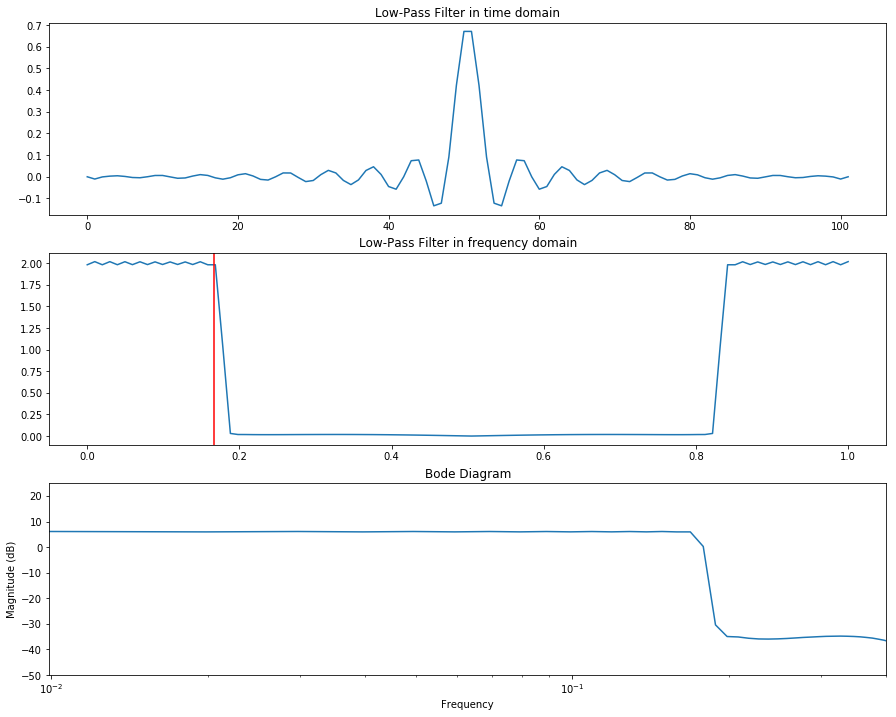

In [ ]:
plt.figure(figsize=(15,12))
plt.subplot(3,1,1)
plt.plot(h)
plt.title('Low-Pass Filter in time domain')

plt.subplot(3,1,2)
plt.plot(np.linspace(0,1,len(H)),H)
plt.axvline(nu_c,color = 'red')
plt.title('Low-Pass Filter in frequency domain')

plt.subplot(3,1,3)
plt.semilogx(np.linspace(0,1,len(H)),dB)
plt.ylabel('Magnitude (dB)')
plt.xlabel('Frequency')
plt.xlim(0,0.4)
plt.ylim(-50,25)
plt.title('Bode Diagram')
plt.show()

### **1.2** Implementation of simple resampling

To achieve the conversion of sampling rate we must first upsample the original signal by L, and then downsample it by M. To do so, we create an upsampling function to zeropad the signal and an downsampling function in order to keep only M samples in the end.

In [ ]:
def upsampling(data, L):
    X_L = np.zeros((len(data)*L)-(L-1))
    X_L[0:len(X_L):L] = data
    return X_L

def downsampling(data, M):
    return data[0:len(data):M]

Finally, to implement the digital processing chain, we apply the original signal in the upsampling function. After that, we apply it in the low-pass filter previously synthetized to remove the spectral content above our cutoff frequency and then we downsample it to achieve the conversion.

In [ ]:
t0 = time.time()

w = upsampling(x,L)
v = np.convolve(w,h)
y = downsampling(v,M)

t1 = time.time()
t_simple = t1-t0

In [ ]:
write('caravan_32kHz.wav',32000,np.array(y,dtype=np.int16))
Audio(y, rate= 32000)

### **1.3** Implementation of efficient resampling

To achieve an optimal conversion, we must apply two successive
polyphase decompositions by using the properties of the noble identitites. The block diagram we will implement is shown below.


To implement it, we need to creat the blocks' functions. As we already have the upsampling and downsampling ones, we only have to establish a function to delay the signal and after that, we have to determine our filters R0 and R1 and then E00, E01, E02, E10, E11 and E12. Finally, we just apply our blocks onto the signal.

In [ ]:
def delay(x,a):
  x = np.concatenate((np.zeros(a),x),axis = None)
  return x
  

In [ ]:
r0 = h[1::2]
r1 = h[0::2]

e00 = r0[0::3]
e01 = r0[1::3]
e02 = r0[2::3]
e10 = r1[0::3]
e11 = r1[1::3]
e12 = r1[2::3]

In [ ]:
t0 = time.time()

# delay
x1 = np.append(delay(x,1),0)
x2 = delay(x1,1)

aux = x.copy()
aux=np.append(aux,0)
aux=np.append(aux,0)

# decimation and filtering
sum1 = np.convolve(e00,downsampling(aux,3)) + np.convolve(e01,downsampling(x1,3)) + np.convolve(e02,downsampling(x2,3))
sum2 = np.convolve(e10,downsampling(aux,3)) + np.convolve(e11,downsampling(x1,3)) + np.convolve(e12,downsampling(x2,3))

# upsampling
y = np.insert(upsampling(sum1,2),0,0) + np.append(upsampling(sum2,2),0)


t1 = time.time()

t_efficient = t1 - t0


### **1.4** Efficiency comparison
To compare the results obtained with the two implementations, we used the time.time function in each implementation to visualize the running times of the two approaches and the results. The results are printed below. 

In [ ]:
print('The unoptimized version took:', t_simple)
print('The optimal implementation took:', t_efficient)

('The unoptimized version took:', 0.051177024841308594)
('The optimal implementation took:', 0.04757094383239746)


## **2.** STFT audio equalization

### **2.1** STFT analysis

#### Question 1 - Hann Window

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app


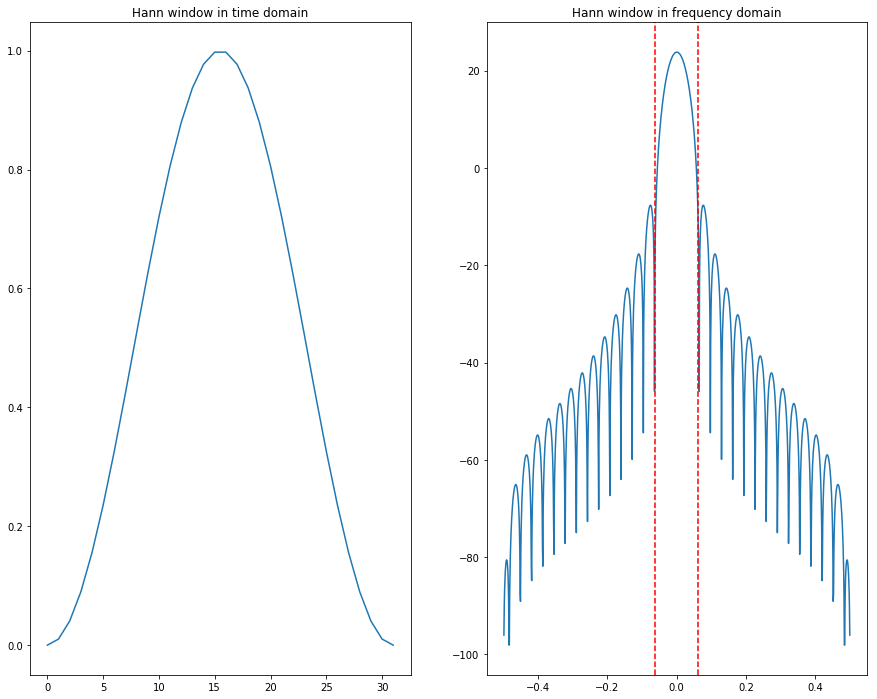

In [ ]:
Nw = 32
w = np.hanning(Nw) # définition de la fenetre d'analyse
M = 1024 # ordre de la tfd

plt.figure(figsize=(15,12))

# Hann Window - time
plt.subplot(1, 2, 1) 
plt.plot(w)
plt.title('Hann window in time domain')

# Hann Window - frequency
fw = np.fft.fft(w,M)
freq = np.linspace(-0.5, 0.5, len(fw))
amp = 20 * np.log10(abs(np.fft.fftshift(fw)))
plt.subplot(1, 2, 2)
plt.plot(freq,amp)
plt.title('Hann window in frequency domain')
plt.axvline(-2.0/Nw,color = 'red', linestyle = '--')
plt.axvline(2.0/Nw,color = 'red', linestyle = '--')
plt.show()

The main lobe of Hann window is given by the region between the red dashed lines, the width of the main lobe is $\frac{4}{N_w}$

#### Question 2 - Band-pass and Low-pass convention


Looking at the code provided on this notebook, we can conclude that the band-pass convention has been implemented.

$\tilde{X}(k,u) = \sum_{n}{x(n + uR)w(n)e^{-j2\pi\frac{kn}{M}}}$

#### Question 3 - Interpretation in terms of filtering

Using the band-pass convention, we want to compute the signal $x_k = \tilde{X}(k,u)$, for k = 3, M = 32 and R = 1

In [ ]:
N = x.shape[0] # % longueur du signal
Nw = 32
w = np.hanning(Nw) # définition de la fenetre d'analyse
ws = w.copy; # définition de la fenêtre de synthèse
R = 1 # incrément sur les temps d'analyse, appelé hop size, t_a=uR
M = 32 # ordre de la tfd
L = M/2+1
affich = 1 ; # pour affichage du spectrogramme, 0 pour
             # pour faire analyse/modif/synthèse sans affichage
             # note: cf. spectrogram sous Matlab
Nt = np.rint((N - Nw) / R) # calcul du nombre de tfd à calculer
Nt = Nt.astype(int)
y = np.zeros((N,1)) # signal de synthèse

if affich:
    Xtilde = np.zeros((M,Nt),dtype=complex)

In [ ]:
for u in np.arange(0,Nt).reshape(-1): # boucle sur les trames
    deb = u * R + 1 # début de trame
    fin = deb + Nw # fin de trame
    tx = np.multiply(x[np.arange(deb.astype(int),fin.astype(int))],w) # calcul de la trame 
    X = np.fft.fft(tx,M) # tfd à l'instant b
    if affich:
        Xtilde[:,u] = X
    # opérations de transformation (sur la partie \nu > 0)
    # ....
    Y = X.copy
    # fin des opérations de transformation
    # resynthèse
    # overlap add

print (Xtilde[3,:])

[ 0.16838493+2.70313201j -1.4026379 +2.57481387j -2.66820324+1.56657199j
 ...  0.34246309+0.71102348j -0.0704793 +0.95651507j
 -0.64456602+0.90614836j]


We can conclude that $x_k(u)$, for k = 3, is a complex signal.

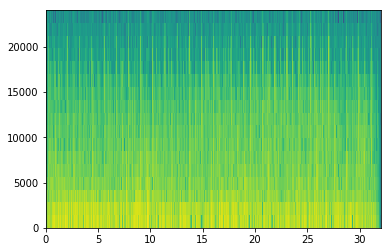

In [ ]:
if affich:
    plt.imshow(20*np.log10(np.abs(Xtilde[np.arange(0,L),:])), aspect='auto',interpolation='none',origin='lower', extent=[0, Nt * R / Fs + Nw / 2, 0, Fs/2])
    

We know that the we can express $\tilde{X}(k,u)$ as:

$\tilde{X}(k,u) = (h*x)(u)$

where $h(n) = w(-n)e^{2\pi\frac{kn}{M}}$, which is a band-pass of center frequency $\frac{k}{M} = \frac{3}{32}$ and bandwidth $\frac{4}{N_w} = \frac{4}{32}$.

So we can get $\tilde{X}$ using a remez filter.



In [ ]:
h=signal.remez(800,[0,0.029,0.031,0.156,0.16,.5],[0,1,0])
H = np.abs(np.fft.fft(h))

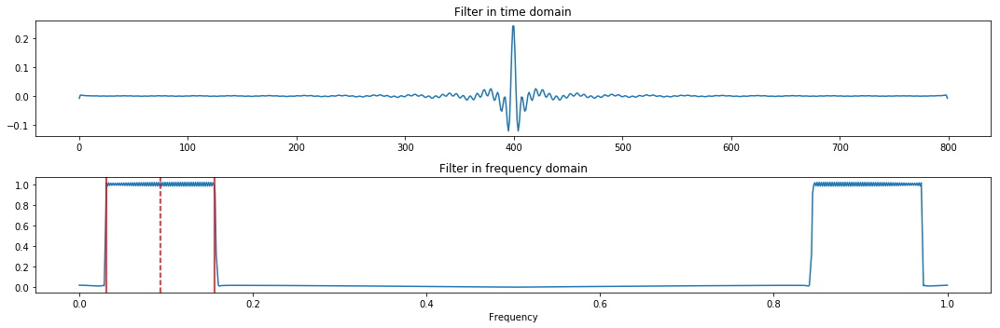

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(2,1,1)
plt.plot(h)
plt.title('Filter in time domain')
plt.subplot(2,1,2)
plt.plot(np.linspace(0,1,len(H)),H)
plt.axvline(3.0/32,color = 'red',linestyle = '--')
plt.title('Filter in frequency domain')
plt.xlabel('Frequency')
plt.axvline((3.0/32) -2.0/Nw,color = 'red', linestyle = '-')
plt.axvline((3.0/32) + 2.0/Nw,color = 'red', linestyle = '-')
plt.tight_layout()
plt.show()

In [ ]:
x3 = np.convolve(h,x)

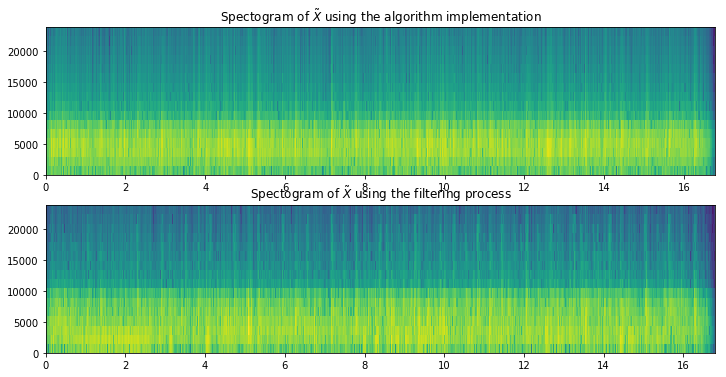

In [ ]:
f_Xtilde, t_Xtilde, Sxx_Xtilde = signal.spectrogram(np.real(Xtilde[3,:]),Fs,w,32)
f_x3, t_x3, Sxx_x3 = signal.spectrogram(np.real(x3),Fs,w,32)

plt.figure(figsize=(12,6))
plt.subplot(2,1,1)
plt.pcolormesh(t_Xtilde, f_Xtilde, 20*np.log10(Sxx_Xtilde), shading='auto')
plt.title(r'Spectogram of $\tilde{X}$ using the algorithm implementation')
plt.subplot(2,1,2)
plt.pcolormesh(t_x3, f_x3, 20*np.log10(Sxx_x3), shading='auto')
plt.title(r"Spectogram of $\tilde{X}$ using the filtering process")
plt.show()

It is noticed that the process that uses a remez bandpass filter generates a spectrogram very similar to that obtained by the algorithm that was provided for this work. In addition, we can also compare the audio generated by the two different processes.


In [ ]:
Audio(np.real(Xtilde[3,:]), rate=Fs)

In [ ]:
Audio(np.real(x3), rate=Fs)

### **2.2**  Overlap-add reconstruction

Being $f(n) = \sum_{u\in\mathbb{Z}}^{} w(n-uR)w_s(n-uR)$, we have to check if f(n)=1 $\forall$n is a perfect reconstruction condition for the product window $w_{p}(n) = w(n)w_{s}(n) = h(n)^{2}$, where h(n) is a Hann window correctly normalized, and for a 75% overlap.

For that, first we apply our hann window without normalizing it in the function to obtain the maximum value in the output. Knowing this value, we use its square root to normalize the window. We observe that the output is not exactly 1 from the beginning to the ending, because $N_{b}$ is finite. Therefore, we will have an almost perfect reconstruction.

In [ ]:
def ola(w = None,hop = None,Nb = 10): 
# function output = ola(w,hop,Nb)
# realise l'addition-recouvrement de la fenetre w,
# avec un décalage hop et un nombre Nb de fenetres.
# par defaut Nb = 10;
    
    w = w[:, np.newaxis]
    N = len(w)
    output = np.zeros(((Nb - 1) * hop + N,1)) # réserve l'espace memoire
    
    for k in np.arange(0,Nb).reshape(-1):
        deb = k* hop
        fin = deb + N
        output[np.arange(deb,fin)] = output[np.arange(deb,fin)] + w # OLA
    
    return output

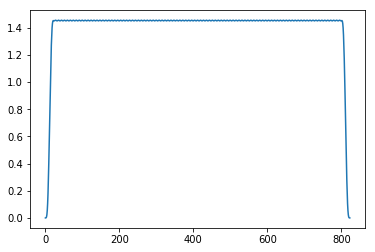

In [ ]:
h=np.multiply(w,w)
f=ola(h,int(0.25*len(w)),100)
plt.plot(np.arange(0,len(f)),f)

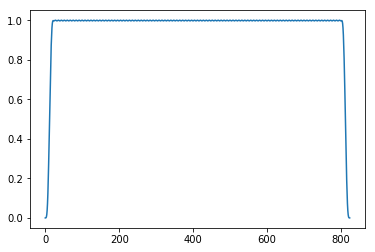

In [ ]:
h=np.multiply(w/np.sqrt(np.amax(f)),w/np.sqrt(np.amax(f)))
f=ola(h,int(0.25*len(w)),100)
plt.plot(np.arange(0,len(f)),f)

FInally, we want to implement the resynthesis according to the
overlap-add approach. In the end, we were able to check the validity of perfect reconstruction by hearing the audio signal and by ploting it through time.

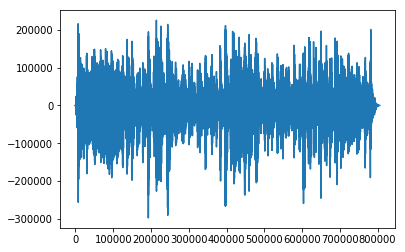

In [ ]:
y=np.zeros(N,dtype=complex)

for u in np.arange(0,Nt).reshape(-1): # boucle sur les trames
    deb = u * R + 1 
    fin = deb + Nw 
    tx=np.fft.ifft(Xtilde[:,u],M)
    y[deb.astype(int):fin.astype(int)]=y[deb.astype(int):fin.astype(int)]+np.multiply(tx,w/np.amax(f))
plt.plot(y)
    

In [ ]:
Audio(y, rate=Fs)

### **2.3**  STFT audio equalizer

In this final section, we're going to equalize the signal. Using a  $\frac{M}{2} + 1 $ real channel, we will assign weights to each channel. So that we can adjust (atenuate or amplificate) each frequency as we want to.

In [ ]:
def equalizer(x,weight,k):
  y = x.copy()
  j = 0
  for i in k:
    y[i,:] =  x[i,:]*weight[j]
    j+=1
  return y

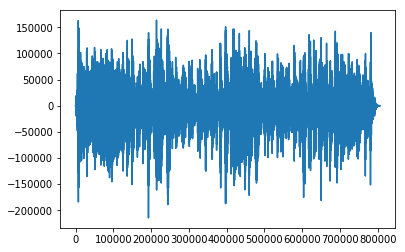

In [ ]:
weights = 0.1*np.ones(M/2+1)
k = np.array(range(17,32))
Xtilde = equalizer(Xtilde,weights,k)
y=np.zeros(N,dtype=complex)
for u in np.arange(0,Nt).reshape(-1): # boucle sur les trames
    deb = u * R + 1 
    fin = deb + Nw 
    tx=np.fft.ifft(Xtilde[:,u],M)
    y[deb.astype(int):fin.astype(int)]=y[deb.astype(int):fin.astype(int)]+np.multiply(tx,w/np.amax(f))
plt.plot(y)




In [ ]:
Audio(y, rate=Fs)